# maxvogt-analysis: Wil SG

The code in this notebook is based on [Martin Fleischmann's](https://martinfleischmann.net/) 2021 workshop [*Capturing the Structure of Cities with Data Science (SDSC)*](https://github.com/martinfleis/sdsc21-workshop), licensed under the [CC BY-SA 4.0 license](https://creativecommons.org/licenses/by-sa/4.0/). © 2021 Martin Fleischmann.

The geodata in this notebook is retrieved from OpenStreetMap. © OpenStreetMap Contributors.

<hr>

This notebook contains geodata and analyses for the following items of the [Max Vogt collection](https://mtwente.github.io/maxvogt/) by Moritz Twente and Luisa Omonsky:
- [WIL008](https://mtwente.github.io/maxvogt/items/wil008.html)

<hr>

Open in an interactive in-browser environment: 

[![Binder](https://mybinder.org/badge_logo.svg)](https://mybinder.org/v2/gh/mtwente/maxvogt-analysis/main?labpath=analysis%2Fwil.ipynb)

In [1]:
import warnings

import geopandas
import libpysal
import momepy
import osmnx
import pandas

from clustergram import Clustergram

import matplotlib.pyplot as plt
from bokeh.io import output_notebook
from bokeh.plotting import show

Pick a place, ideally a town with a good coverage in OpenStreetMap and its local CRS.

In [2]:
place = 'Wil SG, Switzerland'
local_crs = 'EPSG:2056'

In [3]:
geopandas.tools.geocode(place).explore()

## Input data

Download data from OpenStreetMap.

### Buildings

In [4]:
buildings = osmnx.features.features_from_place(place, tags={'building':True})

/Users/mtwente/anaconda3/envs/maxvogt/lib/python3.11/site-packages/shapely/predicates.py:798: RuntimeWarning: invalid value encountered in intersects
  return lib.intersects(a, b, **kwargs)
/Users/mtwente/anaconda3/envs/maxvogt/lib/python3.11/site-packages/shapely/set_operations.py:340: RuntimeWarning: invalid value encountered in union
  return lib.union(a, b, **kwargs)
/Users/mtwente/anaconda3/envs/maxvogt/lib/python3.11/site-packages/shapely/predicates.py:798: RuntimeWarning: invalid value encountered in intersects
  return lib.intersects(a, b, **kwargs)
/Users/mtwente/anaconda3/envs/maxvogt/lib/python3.11/site-packages/shapely/predicates.py:798: RuntimeWarning: invalid value encountered in intersects
  return lib.intersects(a, b, **kwargs)
/Users/mtwente/anaconda3/envs/maxvogt/lib/python3.11/site-packages/shapely/predicates.py:798: RuntimeWarning: invalid value encountered in intersects
  return lib.intersects(a, b, **kwargs)
/Users/mtwente/anaconda3/envs/maxvogt/lib/python3.11/sit

In [5]:
buildings

access addr:city addr:housenumber addr:postcode  \
element_type osmid                                                        
node         6411238896    NaN       NaN              NaN           NaN   
             7503923765    NaN       NaN              NaN           NaN   
             8250178261    NaN       NaN              NaN           NaN   
way          35536392      NaN    Wil SG                2          9500   
             38501949      NaN    Wil SG                2          9500   
...                        ...       ...              ...           ...   
relation     7093154       NaN       NaN               55           NaN   
             7093156       NaN    Wil SG               50          9500   
             7093157       NaN    Wil SG               54          9500   
             7738754       NaN       NaN              NaN           NaN   
             9217834       NaN       NaN              NaN           NaN   

                               addr:street           amenity capacity  fee  \
element_type osmid                                                           
node         6411238896                NaN               NaN      NaN  NaN   
             7503923765                NaN               NaN      NaN  NaN   
             8250178261                NaN               NaN      NaN  NaN   
way          35536392    Pestalozzistrasse               NaN      NaN  NaN   
             38501949          Silostrasse  community_centre      NaN  NaN   
...                                    ...               ...      ...  ...   
relation     7093154          Wilenstrasse               NaN      NaN  NaN   
             7093156          Wilenstrasse               NaN      NaN  NaN   
             7093157          Wilenstrasse               NaN      NaN  NaN   
             7738754                   NaN               NaN      NaN  NaN   
             9217834                   NaN               NaN      NaN  NaN   

                        layer maxheight  ... building:min_level bench  bin  \
element_type osmid                       ...                                 
node         6411238896   NaN       NaN  ...                NaN   NaN  NaN   
             7503923765   NaN       NaN  ...                NaN   NaN  NaN   
             8250178261   NaN       NaN  ...                NaN   NaN  NaN   
way          35536392     NaN       NaN  ...                NaN   NaN  NaN   
             38501949     NaN       NaN  ...                NaN   NaN  NaN   
...                       ...       ...  ...                ...   ...  ...   
relation     7093154      NaN       NaN  ...                NaN   NaN  NaN   
             7093156      NaN       NaN  ...                NaN   NaN  NaN   
             7093157      NaN       NaN  ...                NaN   NaN  NaN   
             7738754      NaN       NaN  ...                NaN   NaN  NaN   
             9217834      NaN       NaN  ...                NaN   NaN  NaN   

                        internet_access animal material operator:website  \
element_type osmid                                                         
node         6411238896             NaN    NaN      NaN              NaN   
             7503923765             NaN    NaN      NaN              NaN   
             8250178261             NaN    NaN      NaN              NaN   
way          35536392               NaN    NaN      NaN              NaN   
             38501949               NaN    NaN      NaN              NaN   
...                                 ...    ...      ...              ...   
relation     7093154                NaN    NaN      NaN              NaN   
             7093156                NaN    NaN      NaN              NaN   
             7093157                NaN    NaN      NaN              NaN   
             7738754                NaN    NaN      NaN              NaN   
             9217834                NaN    NaN      NaN              NaN   

                             

In [6]:
buildings.geom_type.value_counts()

Polygon         4610
Point              3
MultiPolygon       3
Name: count, dtype: int64

In [7]:
buildings = buildings[buildings.geom_type == "Polygon"].reset_index(drop=True)

In [8]:
buildings = buildings[["geometry"]].to_crs(local_crs)

In [9]:
buildings["uID"] = range(len(buildings))

In [10]:
buildings

,geometry,uID
0,"POLYGON ((2720868.224 1258289.437, 2720866.731...",0
1,"POLYGON ((2720427.631 1258028.395, 2720430.877...",1
2,"POLYGON ((2719835.444 1257857.405, 2719930.703...",2
3,"POLYGON ((2720063.781 1257950.769, 2720025.333...",3
4,"POLYGON ((2719864.697 1257696.747, 2719841.658...",4
...,...,...
4605,"POLYGON ((2722197.128 1258406.804, 2722206.030...",4605
4606,"POLYGON ((2721542.379 1258424.249, 2721543.256...",4606
4607,"POLYGON ((2721818.424 1258768.894, 2721816.628...",4607
4608,"POLYGON ((2720255.473 1257831.957, 2720286.893...",4608


### Streets

In comparison to Martin Fleischmann's workshop, I here set `truncate_by_edge` to be `True`.
Depending on the OSM mapping quality of the place at hand, it might also be necessary to change the value of `network_type`. See [geopandas documentation](https://osmnx.readthedocs.io/en/stable/user-reference.html#osmnx.graph.graph_from_place) for options.

In [23]:
osm_graph = osmnx.graph_from_place(place, network_type='bike', truncate_by_edge=True)

/Users/mtwente/anaconda3/envs/maxvogt/lib/python3.11/site-packages/shapely/constructive.py:181: RuntimeWarning: invalid value encountered in buffer
  return lib.buffer(
/Users/mtwente/anaconda3/envs/maxvogt/lib/python3.11/site-packages/shapely/predicates.py:798: RuntimeWarning: invalid value encountered in intersects
  return lib.intersects(a, b, **kwargs)
/Users/mtwente/anaconda3/envs/maxvogt/lib/python3.11/site-packages/shapely/set_operations.py:340: RuntimeWarning: invalid value encountered in union
  return lib.union(a, b, **kwargs)
/Users/mtwente/anaconda3/envs/maxvogt/lib/python3.11/site-packages/shapely/predicates.py:798: RuntimeWarning: invalid value encountered in intersects
  return lib.intersects(a, b, **kwargs)
/Users/mtwente/anaconda3/envs/maxvogt/lib/python3.11/site-packages/shapely/set_operations.py:340: RuntimeWarning: invalid value encountered in union
  return lib.union(a, b, **kwargs)


In [24]:
osm_graph = osmnx.projection.project_graph(osm_graph, to_crs=local_crs)

In [25]:
streets = osmnx.graph_to_gdfs(
    osm_graph, 
    nodes=False, 
    edges=True,
    node_geometry=False, 
    fill_edge_geometry=True
)

In [26]:
streets.explore()

In [27]:
streets

osmid lanes  ref  \
u           v           key                                     
27942248    27942262    0                  4484704     2   16   
            3441585825  0                337061286   NaN  NaN   
27942262    9819957444  0    [4484704, 1069941129]     2   16   
            27942248    0                  4484704     2   16   
            529839769   0     [42439096, 54035694]   NaN  NaN   
...                                            ...   ...  ...   
12176789609 12176789608 0               1315522692   NaN  NaN   
12176789618 12176789619 0               1315522696   NaN  NaN   
            2303069066  0                 35094575   NaN  NaN   
12176789619 12176789618 0               1315522696   NaN  NaN   
12183026589 12183026589 0               1316256617   NaN  NaN   

                                        name               highway  maxspeed  \
u           v           key                                                    
27942248    27942262    0       Hauptstrasse               primary        80   
            3441585825  0                NaN                 track       NaN   
27942262    9819957444  0       Hauptstrasse               primary  [50, 80]   
            27942248    0       Hauptstrasse               primary        80   
            529839769   0       Dornäckerweg  [residential, track]       NaN   
...                                      ...                   ...       ...   
12176789609 12176789608 0                NaN               service       NaN   
12176789618 12176789619 0                NaN               service       NaN   
            2303069066  0    Bergholzstrasse           residential        30   
12176789619 12176789618 0                NaN               service       NaN   
12183026589 12183026589 0                NaN               service       NaN   

                             oneway       reversed   length  \
u           v           key                                   
27942248    27942262    0     False          False  218.097   
            3441585825  0     False          False  225.467   
27942262    9819957444  0     False          False  361.056   
            27942248    0     False           True  218.097   
            529839769   0     False  [False, True]  493.298   
...                             ...            ...      ...   
12176789609 12176789608 0     False           True    8.057   
12176789618 12176789619 0     False          False    6.793   
            2303069066  0      True          False   59.697   
12176789619 12176789618 0     False           True    6.793   
12183026589 12183026589 0      True          False   75.823   

                                                                      geometry  \
u           v           key                                                      
27942248    27942262    0    LINESTRING (2719926.856 1261119.172, 2719937.1...   
            3441585825  0    LINESTRING (2719926.856 1261119.172, 2719923.8...   
27942262    9819957444  0    LINESTRING (2720016.357 1260928.853, 2720018.1...   
            27942248    0    LINESTRING (2720016.357 1260928.853, 2720012.5...   
            529839769   0    LINESTRING (2720016.357 1260928.853, 2720026.4...   
...                                                                        ...   
12176789609 12176789608 0    LINESTRING (2720685.166 1257775.986, 2720684.5...   
12176789618 12176789619 0    LINESTRING (2720631.057 1257772.758, 2720631.4...   
            2303069066  0    LINESTRING (2720631.057 1257772.758, 2720621.5...   
12176789619 12176789618 0    LINESTRING (2720631.462 1257779.539, 2720631.0...   
12183026589 12183026589 0    LINESTRING (2722055.653 1257939.018, 2722041.7...   

                            bridge        service junction access width  \
u           v           key                                               
27942248    27942262    0      NaN            NaN      NaN    NaN   NaN   
            3441585825  0      NaN            

In [28]:
streets = momepy.remove_false_nodes(streets)
streets = streets[["geometry"]]
streets["nID"] = range(len(streets))

In [29]:
streets

,geometry,nID
0,"LINESTRING (2719926.856 1261119.172, 2719937.1...",0
1,"LINESTRING (2720016.357 1260928.853, 2720018.1...",1
2,"LINESTRING (2720016.357 1260928.853, 2720012.5...",2
3,"LINESTRING (2720016.357 1260928.853, 2720026.4...",3
4,"LINESTRING (2720038.238 1260571.059, 2720034.7...",4
...,...,...
5543,"LINESTRING (2724660.089 1260558.197, 2724642.1...",5543
5544,"LINESTRING (2724407.577 1259715.351, 2724413.2...",5544
5545,"LINESTRING (2724875.507 1260185.316, 2724870.1...",5545
5546,"LINESTRING (2724826.100 1260317.881, 2724829.9...",5546


## Generated data

### Tessellation

We can generate a spatail unit using Voronoi tessellation with given building footprints.

In [30]:
limit = momepy.buffered_limit(buildings, 100)

tessellation = momepy.Tessellation(buildings, "uID", limit, verbose=False, segment=1)
tessellation = tessellation.tessellation

/Users/mtwente/anaconda3/envs/maxvogt/lib/python3.11/site-packages/shapely/constructive.py:181: RuntimeWarning: invalid value encountered in buffer
  return lib.buffer(
/Users/mtwente/anaconda3/envs/maxvogt/lib/python3.11/site-packages/shapely/set_operations.py:426: RuntimeWarning: invalid value encountered in unary_union
  return lib.unary_union(collections, **kwargs)
/var/folders/vs/1r1r5k5x12v5dj0w9z79tj3c0000gn/T/ipykernel_37270/1328706492.py:3: FutureWarning: Class based API like `momepy.Tessellation` is deprecated. Replace it with `momepy.morphological_tessellation` or `momepy.enclosed_tessellation` to use functional API instead or pin momepy version <1.0. Class-based API will be removed in 1.0. 
  tessellation = momepy.Tessellation(buildings, "uID", limit, verbose=False, segment=1)
/Users/mtwente/anaconda3/envs/maxvogt/lib/python3.11/site-packages/shapely/constructive.py:181: RuntimeWarning: invalid value encountered in buffer
  return lib.buffer(
/Users/mtwente/anaconda3/envs/m

### Link streets

Link unique IDs of streets to buildings and tessellation cells based on the nearest neighbor join.

In [31]:
buildings = buildings.sjoin_nearest(streets, max_distance=1000, how="left")

In [32]:
buildings

,geometry,uID,index_right,nID
0,"POLYGON ((2720868.224 1258289.437, 2720866.731...",0,1067,1067
0,"POLYGON ((2720868.224 1258289.437, 2720866.731...",0,110,110
1,"POLYGON ((2720427.631 1258028.395, 2720430.877...",1,1858,1858
1,"POLYGON ((2720427.631 1258028.395, 2720430.877...",1,1853,1853
2,"POLYGON ((2719835.444 1257857.405, 2719930.703...",2,4658,4658
...,...,...,...,...
4606,"POLYGON ((2721542.379 1258424.249, 2721543.256...",4606,5273,5273
4607,"POLYGON ((2721818.424 1258768.894, 2721816.628...",4607,5346,5346
4608,"POLYGON ((2720255.473 1257831.957, 2720286.893...",4608,4247,4247
4608,"POLYGON ((2720255.473 1257831.957, 2720286.893...",4608,2176,2176


In [33]:
buildings = buildings.drop_duplicates("uID").drop(columns="index_right")

In [34]:
tessellation = tessellation.merge(buildings[['uID', 'nID']], on='uID', how='left')

## Measure

Measure individual morphometric characters.

### Dimensions

In [35]:
buildings["area"] = buildings.area
tessellation["area"] = tessellation.area
streets["length"] = streets.length

### Shape

In [36]:
buildings['eri'] = momepy.EquivalentRectangularIndex(buildings).series

/var/folders/vs/1r1r5k5x12v5dj0w9z79tj3c0000gn/T/ipykernel_37270/1902756608.py:1: FutureWarning: Class based API like `momepy.EquivalentRectangularIndex` is deprecated. Replace it with `momepy.equivalent_rectangular_index` to use functional API instead or pin momepy version <1.0. Class-based API will be removed in 1.0. 
  buildings['eri'] = momepy.EquivalentRectangularIndex(buildings).series
/Users/mtwente/anaconda3/envs/maxvogt/lib/python3.11/site-packages/pandas/core/arraylike.py:492: RuntimeWarning: invalid value encountered in oriented_envelope
  return getattr(ufunc, method)(*new_inputs, **kwargs)


In [37]:
buildings['elongation'] = momepy.Elongation(buildings).series

/var/folders/vs/1r1r5k5x12v5dj0w9z79tj3c0000gn/T/ipykernel_37270/3723954296.py:1: FutureWarning: Class based API like `momepy.Elongation` is deprecated. Replace it with `momepy.elongation` to use functional API instead or pin momepy version <1.0. Class-based API will be removed in 1.0. 
  buildings['elongation'] = momepy.Elongation(buildings).series
/Users/mtwente/anaconda3/envs/maxvogt/lib/python3.11/site-packages/pandas/core/arraylike.py:492: RuntimeWarning: invalid value encountered in oriented_envelope
  return getattr(ufunc, method)(*new_inputs, **kwargs)


In [38]:
tessellation['convexity'] = momepy.Convexity(tessellation).series

/var/folders/vs/1r1r5k5x12v5dj0w9z79tj3c0000gn/T/ipykernel_37270/2335586521.py:1: FutureWarning: Class based API like `momepy.Convexity` is deprecated. Replace it with `momepy.convexity` to use functional API instead or pin momepy version <1.0. Class-based API will be removed in 1.0. 
  tessellation['convexity'] = momepy.Convexity(tessellation).series


In [39]:
streets["linearity"] = momepy.Linearity(streets).series

/var/folders/vs/1r1r5k5x12v5dj0w9z79tj3c0000gn/T/ipykernel_37270/3802614628.py:1: FutureWarning: Class based API like `momepy.Linearity` is deprecated. Replace it with `momepy.linearity` to use functional API instead or pin momepy version <1.0. Class-based API will be removed in 1.0. 
  streets["linearity"] = momepy.Linearity(streets).series


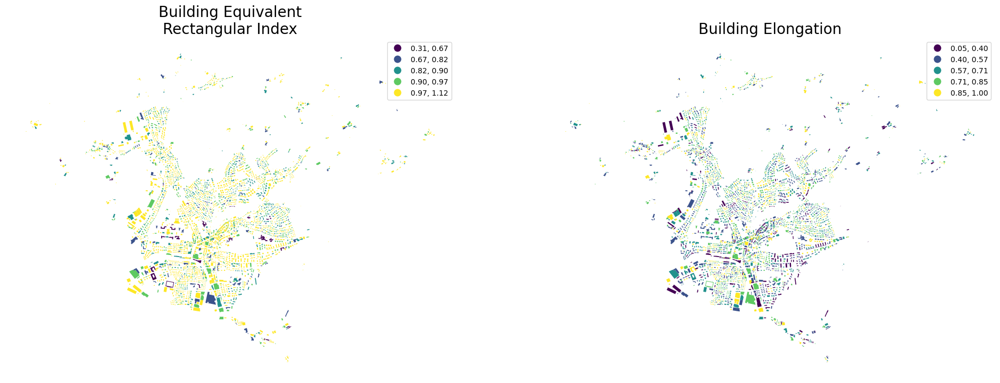

In [41]:
fig, ax = plt.subplots(1, 2, figsize=(24, 12))

buildings.plot("eri", ax=ax[0], scheme="natural_breaks", legend=True)
buildings.plot("elongation", ax=ax[1], scheme="natural_breaks", legend=True)

ax[0].set_title('Building Equivalent\nRectangular Index', fontsize=20)
ax[1].set_title('Building Elongation', fontsize=20)

ax[0].set_axis_off()
ax[1].set_axis_off()

plt.savefig('../results/Wil/eri_and_elongation.svg')  

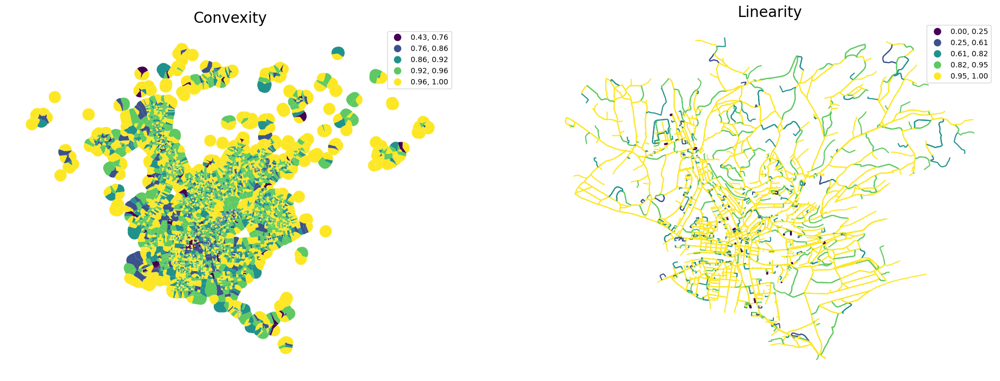

In [42]:
fig, ax = plt.subplots(1, 2, figsize=(24, 12))

tessellation.plot("convexity", ax=ax[0], scheme="natural_breaks", legend=True)
streets.plot("linearity", ax=ax[1], scheme="natural_breaks", legend=True)

ax[0].set_title('Convexity', fontsize=20)
ax[1].set_title('Linearity', fontsize=20)

ax[0].set_axis_off()
ax[1].set_axis_off()

plt.savefig('../results/Wil/convexity_and_linearity.svg')  

### Spatial distribution

In [43]:
buildings["shared_walls"] = momepy.SharedWallsRatio(buildings).series

/Users/mtwente/anaconda3/envs/maxvogt/lib/python3.11/site-packages/momepy/distribution.py:214: FutureWarning: Class based API like `momepy.SharedWalls` or `momepy.SharedWallsRatio` is deprecated. Replace it with `momepy.shared_walls` or explicitly computing `momepy.shared_walls / gdf.length` respectively to use functional API instead or pin momepy version <1.0. Class-based API will be removed in 1.0. 
  super().__init__(gdf)
/Users/mtwente/anaconda3/envs/maxvogt/lib/python3.11/site-packages/shapely/set_operations.py:133: RuntimeWarning: invalid value encountered in intersection
  return lib.intersection(a, b, **kwargs)


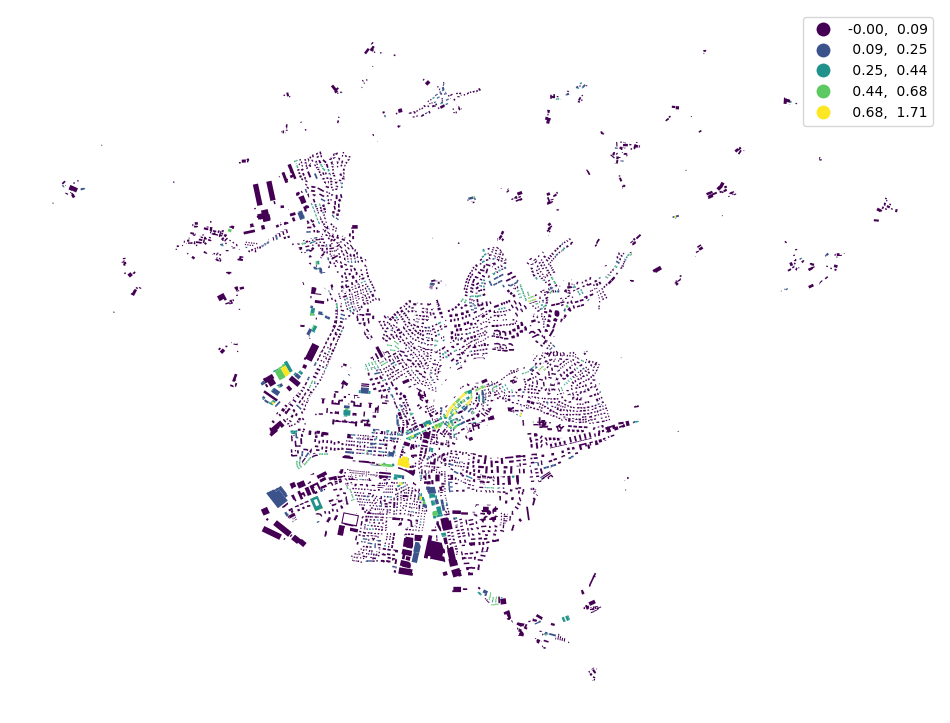

In [44]:
buildings.plot("shared_walls", figsize=(12, 12), scheme="natural_breaks", legend=True).set_axis_off()

plt.savefig('../results/Wil/sharedwalls.svg')  

Generate spatial weights matrix using `libpysal`.

In [45]:
queen_1 = libpysal.weights.contiguity.Queen.from_dataframe(tessellation, ids="uID", silence_warnings=True)

In [46]:
tessellation["neighbors"] = momepy.Neighbors(tessellation, queen_1, "uID", weighted=True, verbose=False).series
tessellation["covered_area"] = momepy.CoveredArea(tessellation, queen_1, "uID", verbose=False).series

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    
    buildings["neighbor_distance"] = momepy.NeighborDistance(buildings, queen_1, "uID", verbose=False).series

/var/folders/vs/1r1r5k5x12v5dj0w9z79tj3c0000gn/T/ipykernel_37270/1669107924.py:1: FutureWarning: Class based API like `momepy.Neighbors` is deprecated. Replace it with `momepy.neighbors` to use functional API instead or pin momepy version <1.0. Class-based API will be removed in 1.0. 
  tessellation["neighbors"] = momepy.Neighbors(tessellation, queen_1, "uID", weighted=True, verbose=False).series
/var/folders/vs/1r1r5k5x12v5dj0w9z79tj3c0000gn/T/ipykernel_37270/1669107924.py:2: FutureWarning: `momepy.CoveredArea` is deprecated. Replace it with `.describe()` method of libpysal.graph.Graph or pin momepy version <1.0. This class will be removed in 1.0. 
  tessellation["covered_area"] = momepy.CoveredArea(tessellation, queen_1, "uID", verbose=False).series


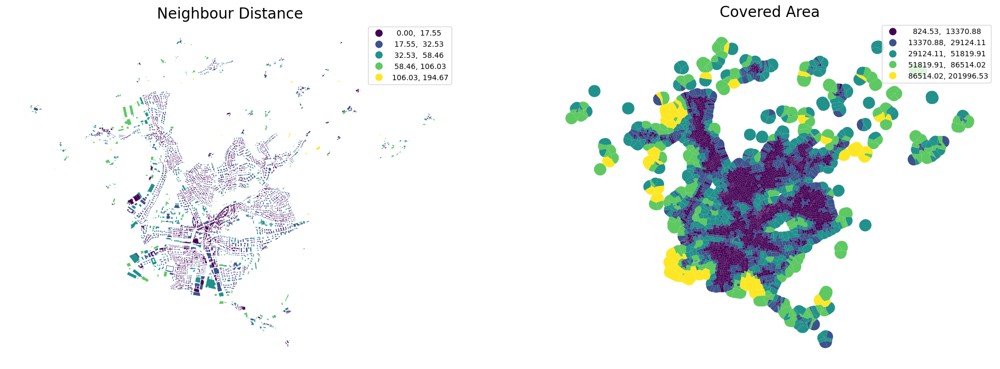

In [47]:
fig, ax = plt.subplots(1, 2, figsize=(24, 12))

buildings.plot("neighbor_distance", ax=ax[0], scheme="natural_breaks", legend=True)
tessellation.plot("covered_area", ax=ax[1], scheme="natural_breaks", legend=True)

ax[0].set_title('Neighbour Distance', fontsize=20)
ax[1].set_title('Covered Area', fontsize=20)


ax[0].set_axis_off()
ax[1].set_axis_off()

plt.savefig('../results/Wil/neighbourdist_and_coveredarea.svg')  

In [48]:
queen_3 = momepy.sw_high(k=3, weights=queen_1)
buildings_q1 = libpysal.weights.contiguity.Queen.from_dataframe(buildings, silence_warnings=True)

buildings['interbuilding_distance'] = momepy.MeanInterbuildingDistance(buildings, queen_1, 'uID', queen_3, verbose=False).series
buildings['adjacency'] = momepy.BuildingAdjacency(buildings, queen_3, 'uID', buildings_q1, verbose=False).series

/var/folders/vs/1r1r5k5x12v5dj0w9z79tj3c0000gn/T/ipykernel_37270/3221532125.py:1: FutureWarning: `momepy.sw_high` is deprecated. Replace it with .higher_order() method of libpysal.graph.Graph or pin momepy version <1.0. This class will be removed in 1.0. 
  queen_3 = momepy.sw_high(k=3, weights=queen_1)
/var/folders/vs/1r1r5k5x12v5dj0w9z79tj3c0000gn/T/ipykernel_37270/3221532125.py:2: FutureWarning: `use_index` defaults to False but will default to True in future. Set True/False directly to control this behavior and silence this warning
  buildings_q1 = libpysal.weights.contiguity.Queen.from_dataframe(buildings, silence_warnings=True)
/var/folders/vs/1r1r5k5x12v5dj0w9z79tj3c0000gn/T/ipykernel_37270/3221532125.py:4: FutureWarning: Class based API like `momepy.MeanInterbuildingDistance` is deprecated. Replace it with `momepy.mean_interbuilding_distance` to use functional API instead or pin momepy version <1.0. Class-based API will be removed in 1.0. 
  buildings['interbuilding_distance'] 

In [49]:
#fig, ax = plt.subplots(1, 2, figsize=(24, 12))
#
#buildings.plot("interbuilding_distance", ax=ax[0], scheme="natural_breaks", legend=True)
#buildings.plot("adjacency", ax=ax[1], scheme="natural_breaks", legend=True)
#
#ax[0].set_axis_off()
#ax[1].set_axis_off()

In [50]:
profile = momepy.StreetProfile(streets, buildings)
streets["width"] = profile.w
streets["width_deviation"] = profile.wd
streets["openness"] = profile.o

/var/folders/vs/1r1r5k5x12v5dj0w9z79tj3c0000gn/T/ipykernel_37270/2648127835.py:1: FutureWarning: Class based API like `momepy.StreetProfile` is deprecated. Replace it with `momepy.street_profile` to use functional API instead or pin momepy version <1.0. Class-based API will be removed in 1.0. 
  profile = momepy.StreetProfile(streets, buildings)
/Users/mtwente/anaconda3/envs/maxvogt/lib/python3.11/site-packages/pandas/core/arraylike.py:492: RuntimeWarning: invalid value encountered in intersection
  return getattr(ufunc, method)(*new_inputs, **kwargs)


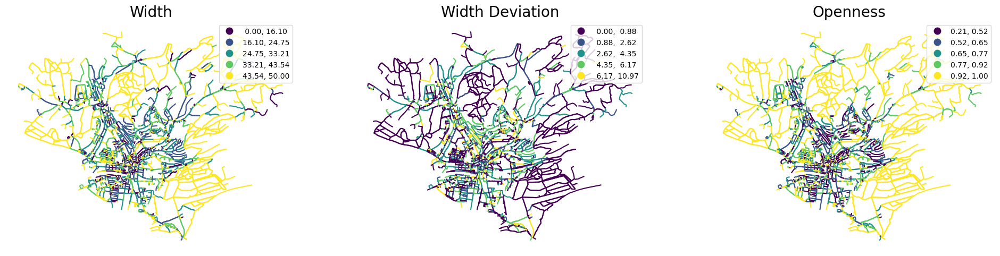

In [51]:
fig, ax = plt.subplots(1, 3, figsize=(24, 12))

streets.plot("width", ax=ax[0], scheme="natural_breaks", legend=True)
streets.plot("width_deviation", ax=ax[1], scheme="natural_breaks", legend=True)
streets.plot("openness", ax=ax[2], scheme="natural_breaks", legend=True)

ax[0].set_title('Width', fontsize=20)
ax[1].set_title('Width Deviation', fontsize=20)
ax[2].set_title('Openness', fontsize=20)

ax[0].set_axis_off()
ax[1].set_axis_off()
ax[2].set_axis_off()

plt.savefig('../results/Wil/road_network.svg')  

### Intensity

In [52]:
tessellation['car'] = momepy.AreaRatio(tessellation, buildings, 'area', 'area', 'uID').series

/var/folders/vs/1r1r5k5x12v5dj0w9z79tj3c0000gn/T/ipykernel_37270/1819725789.py:1: FutureWarning: `momepy.AreaRatio` is deprecated. Replace it with a direct division of areas or momepy.describe_agg() or pin momepy version <1.0. This class will be removed in 1.0. 
  tessellation['car'] = momepy.AreaRatio(tessellation, buildings, 'area', 'area', 'uID').series


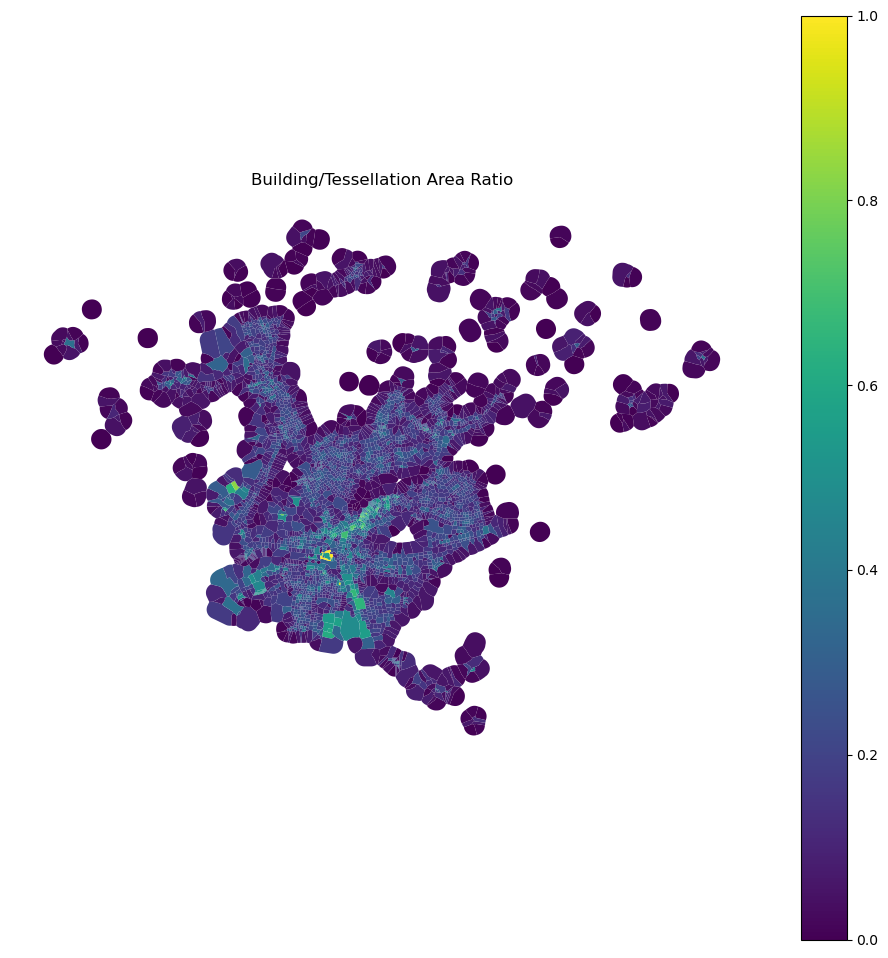

In [53]:
tessellation.plot("car", figsize=(12, 12), vmin=0, vmax=1, legend=True).set_axis_off()
plt.title("Building/Tessellation Area Ratio")

plt.savefig('../results/Wil/tessellation_ratio.svg')  

### Connectivity

In [54]:
graph = momepy.gdf_to_nx(streets)

In [55]:
graph = momepy.node_degree(graph)
graph = momepy.closeness_centrality(graph, radius=400, distance="mm_len")
graph = momepy.meshedness(graph, radius=400, distance="mm_len")

  0%|          | 0/2678 [00:00<?, ?it/s]

  0%|          | 0/2678 [00:00<?, ?it/s]

In [56]:
nodes, streets = momepy.nx_to_gdf(graph)

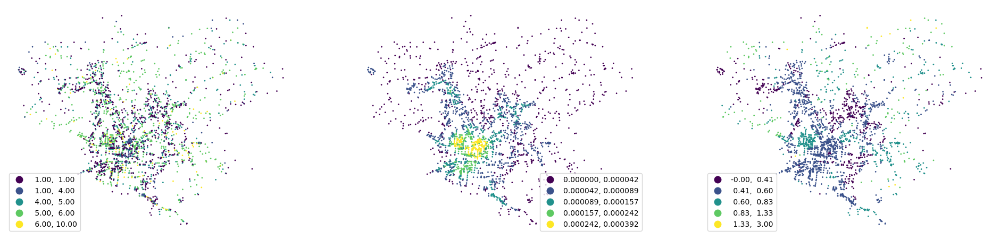

In [57]:
fig, ax = plt.subplots(1, 3, figsize=(24, 12))

nodes.plot("degree", ax=ax[0], scheme="natural_breaks", legend=True, markersize=1)
nodes.plot("closeness", ax=ax[1], scheme="natural_breaks", legend=True, markersize=1, legend_kwds={"fmt": "{:.6f}"})
nodes.plot("meshedness", ax=ax[2], scheme="natural_breaks", legend=True, markersize=1)

ax[0].set_axis_off()
ax[1].set_axis_off()
ax[2].set_axis_off()

plt.savefig('../results/Wil/connectivity.svg')  

In [58]:
buildings["nodeID"] = momepy.get_node_id(buildings, nodes, streets, "nodeID", "nID")

/var/folders/vs/1r1r5k5x12v5dj0w9z79tj3c0000gn/T/ipykernel_37270/403706460.py:1: FutureWarning: Class based API like `momepy.get_node_id` is deprecated. Replace it with `momepy.get_nearest_node` to use functional API instead or pin momepy version <1.0. Class-based API will be removed in 1.0. 
  buildings["nodeID"] = momepy.get_node_id(buildings, nodes, streets, "nodeID", "nID")


  0%|          | 0/4610 [00:00<?, ?it/s]

Link all data together (to tessellation cells or buildings).

In [59]:
tessellation

,uID,geometry,nID,area,convexity,neighbors,covered_area,car
0,277,"POLYGON ((2722437.699 1256336.134, 2722447.794...",5460,10906.277924,0.993038,0.007361,28390.245097,0.003546
1,287,"POLYGON ((2722078.283 1256596.338, 2722078.979...",2337,16430.353520,0.961048,0.009949,31284.675668,0.014613
2,3989,"POLYGON ((2721649.024 1256947.489, 2721649.956...",2761,5592.215702,0.978679,0.009218,13382.341425,0.006240
3,1579,"POLYGON ((2721435.772 1257055.002, 2721435.401...",3957,9446.056928,0.951339,0.014343,79598.639618,0.050403
4,1658,"POLYGON ((2721446.800 1257211.374, 2721446.220...",5259,5234.010551,0.829462,0.015694,47121.278112,0.241007
...,...,...,...,...,...,...,...,...
4605,1072,"POLYGON ((2719938.713 1261166.860, 2719942.129...",2,16373.405462,0.986677,0.004000,48327.937442,0.008280
4606,3536,"POLYGON ((2718245.375 1260471.040, 2718240.994...",4765,18350.987872,0.980604,0.009456,50119.719406,0.024617
4607,1074,"POLYGON ((2719991.328 1261068.761, 2719991.594...",2,15187.949214,0.703458,0.003243,48327.937442,0.034843
4608,3643,"POLYGON ((2718493.976 1260790.816, 2718503.770...",4775,34489.304964,1.000000,0.000000,34489.304964,0.001702


In [60]:
merged = tessellation.merge(buildings.drop(columns=['nID', 'geometry']), on='uID')
merged = merged.merge(streets.drop(columns='geometry'), on='nID', how='left')
merged = merged.merge(nodes.drop(columns='geometry'), on='nodeID', how='left')

In [61]:
merged.columns

Index(['uID', 'geometry', 'nID', 'area_x', 'convexity', 'neighbors',
       'covered_area', 'car', 'area_y', 'eri', 'elongation', 'shared_walls',
       'neighbor_distance', 'interbuilding_distance', 'adjacency', 'nodeID',
       'length', 'linearity', 'width', 'width_deviation', 'openness', 'mm_len',
       'node_start', 'node_end', 'x', 'y', 'degree', 'closeness',
       'meshedness'],
      dtype='object')

## Understanding the context

Measure first, second and third quartile of distribution of values within an area around each building.

In [62]:
percentiles = []
for column in merged.columns.drop(["uID", "nodeID", "nID", 'mm_len', 'node_start', 'node_end', "geometry"]):
    perc = momepy.Percentiles(merged, column, queen_3, "uID", verbose=False).frame
    perc.columns = [f"{column}_" + str(x) for x in perc.columns]
    percentiles.append(perc)

/var/folders/vs/1r1r5k5x12v5dj0w9z79tj3c0000gn/T/ipykernel_37270/962013058.py:3: FutureWarning: Class based API like `momepy.Percentiles` is deprecated. Replace it with `momepy.percentile` to use functional API instead or pin momepy version <1.0. Class-based API will be removed in 1.0. 
  perc = momepy.Percentiles(merged, column, queen_3, "uID", verbose=False).frame
/var/folders/vs/1r1r5k5x12v5dj0w9z79tj3c0000gn/T/ipykernel_37270/962013058.py:3: FutureWarning: Class based API like `momepy.Percentiles` is deprecated. Replace it with `momepy.percentile` to use functional API instead or pin momepy version <1.0. Class-based API will be removed in 1.0. 
  perc = momepy.Percentiles(merged, column, queen_3, "uID", verbose=False).frame
/var/folders/vs/1r1r5k5x12v5dj0w9z79tj3c0000gn/T/ipykernel_37270/962013058.py:3: FutureWarning: Class based API like `momepy.Percentiles` is deprecated. Replace it with `momepy.percentile` to use functional API instead or pin momepy version <1.0. Class-based API

In [63]:
percentiles_joined = pandas.concat(percentiles, axis=1)

In [64]:
percentiles_joined

,area_x_25,area_x_50,area_x_75,convexity_25,convexity_50,convexity_75,neighbors_25,neighbors_50,neighbors_75,covered_area_25,...,y_75,degree_25,degree_50,degree_75,closeness_25,closeness_50,closeness_75,meshedness_25,meshedness_50,meshedness_75
0,5035.910966,9289.799207,10683.751534,0.917265,0.976080,0.988445,0.006297,0.007464,0.012149,27209.862068,...,1.256396e+06,6.0,6.0,6.0,0.000033,0.000036,0.000037,0.527864,0.529412,0.529412
1,1360.837004,3351.597993,7784.537383,0.919934,0.949568,0.978745,0.012087,0.019701,0.026994,25158.490547,...,1.256692e+06,5.0,5.0,6.0,0.000036,0.000037,0.000047,0.709677,0.742857,0.783784
2,229.492865,545.393694,4234.339792,0.918743,0.959249,0.981915,0.016595,0.043908,0.076710,5664.153577,...,1.256989e+06,1.0,4.0,4.0,0.000098,0.000117,0.000117,0.487179,0.504132,0.504132
3,2035.328173,3365.440785,8623.628349,0.915562,0.941315,0.971990,0.013346,0.017678,0.031967,23159.794649,...,1.257344e+06,2.0,4.5,6.0,0.000076,0.000101,0.000117,0.476821,0.491817,0.503817
4,2035.349260,3129.482084,8057.860879,0.910954,0.948853,0.971990,0.014206,0.025488,0.032549,19756.923441,...,1.257386e+06,1.0,4.0,6.0,0.000064,0.000085,0.000108,0.423032,0.483660,0.500107
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4605,15780.677338,16373.405462,16569.994114,0.845067,0.986677,0.993037,0.003598,0.003952,0.003976,48327.937442,...,1.261119e+06,3.0,3.0,3.0,0.000003,0.000003,0.000003,1.000000,1.000000,1.000000
4606,4671.256479,7395.393482,15939.066661,0.944006,0.979563,0.994957,0.008497,0.010854,0.017931,39422.035647,...,1.260368e+06,1.0,2.5,4.5,0.000047,0.000049,0.000053,0.351351,0.351351,0.358974
4607,15780.677338,16373.405462,16569.994114,0.845067,0.986677,0.993037,0.003598,0.003952,0.003976,48327.937442,...,1.261119e+06,3.0,3.0,3.0,0.000003,0.000003,0.000003,1.000000,1.000000,1.000000
4608,34489.304964,34489.304964,34489.304964,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,34489.304964,...,1.260697e+06,1.0,1.0,1.0,0.000002,0.000002,0.000002,1.000000,1.000000,1.000000


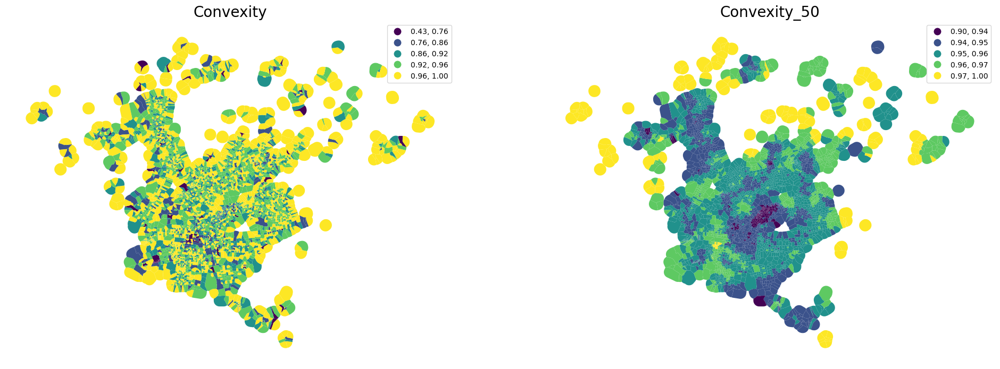

In [65]:
fig, ax = plt.subplots(1, 2, figsize=(24, 12))

tessellation.plot("convexity", ax=ax[0], scheme="natural_breaks", legend=True)
merged.plot(percentiles_joined['convexity_50'].values, ax=ax[1], scheme="natural_breaks", legend=True)

ax[0].set_title('Convexity', fontsize=20)
ax[1].set_title('Convexity_50', fontsize=20)

ax[0].set_axis_off()
ax[1].set_axis_off()

plt.savefig('../results/Wil/convexity.svg')  

## Clustering

Standardize values before clustering.

In [66]:
standardized = (percentiles_joined - percentiles_joined.mean()) / percentiles_joined.std()

In [67]:
standardized

,area_x_25,area_x_50,area_x_75,convexity_25,convexity_50,convexity_75,neighbors_25,neighbors_50,neighbors_75,covered_area_25,...,y_75,degree_25,degree_50,degree_75,closeness_25,closeness_50,closeness_75,meshedness_25,meshedness_50,meshedness_75
0,1.854456,2.711973,1.875506,-0.326341,1.884497,1.958257,-2.164043,-2.646616,-2.684072,1.930430,...,-2.749114,1.460624,0.792119,0.169849,-0.657605,-0.805611,-0.952475,0.712218,0.405159,0.069775
1,0.123622,0.563886,1.149435,-0.197116,-0.524890,0.602628,-1.671195,-1.676344,-1.646200,1.703899,...,-2.424764,0.947030,-0.049861,0.169849,-0.595577,-0.787752,-0.800668,2.211033,2.168881,1.951438
2,-0.409202,-0.451231,0.260335,-0.254789,0.354868,1.045638,-1.287382,0.242929,1.829578,-0.448848,...,-2.100580,-1.107347,-0.891842,-2.076933,0.486204,0.461082,0.182734,0.376829,0.196272,-0.117225
3,0.441284,0.568894,1.359575,-0.408800,-1.274933,-0.341387,-1.564028,-1.836759,-1.298542,1.483184,...,-1.713135,-0.593753,-0.470852,0.169849,0.111742,0.210482,0.176984,0.291438,0.094507,-0.119558
4,0.441294,0.483538,1.217886,-0.631908,-0.589902,-0.341387,-1.490817,-1.217524,-1.257886,1.107407,...,-1.667207,-1.107347,-0.891842,0.169849,-0.104701,-0.037285,0.048219,-0.151980,0.027109,-0.147003
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4605,6.914872,5.274398,3.349638,-3.821713,2.847532,2.599964,-2.393856,-2.925045,-3.255516,4.262485,...,2.411234,-0.080159,-1.733823,-3.200324,-1.176190,-1.315198,-1.421373,4.604363,4.293680,3.550852
4606,1.682716,2.026690,3.191631,0.968266,2.201069,2.868268,-1.976815,-2.377809,-2.279886,3.279013,...,1.590826,-1.107347,-2.154813,-1.515238,-0.410931,-0.596126,-0.727815,-0.742896,-1.066173,-1.191000
4607,6.914872,5.274398,3.349638,-3.821713,2.847532,2.599964,-2.393856,-2.925045,-3.255516,4.262485,...,2.411234,-0.080159,-1.733823,-3.200324,-1.176190,-1.315198,-1.421373,4.604363,4.293680,3.550852
4608,15.725993,11.827648,7.837296,3.679164,4.058346,3.573083,-2.700101,-3.238394,-3.533481,2.734294,...,1.949508,-1.107347,-3.417784,-5.447106,-1.193437,-1.330452,-1.435148,4.604363,4.293680,3.550852


### How many clusters?

In [68]:
cgram = Clustergram(range(1, 12), n_init=10, random_state=0)
cgram.fit(standardized.fillna(0))

K=1 skipped. Mean computed from data directly.
K=2 fitted in 0.060 seconds.
K=3 fitted in 0.065 seconds.
K=4 fitted in 0.064 seconds.
K=5 fitted in 0.063 seconds.
K=6 fitted in 0.066 seconds.
K=7 fitted in 0.097 seconds.
K=8 fitted in 0.150 seconds.
K=9 fitted in 0.095 seconds.
K=10 fitted in 0.106 seconds.
K=11 fitted in 0.182 seconds.


Clustergram(k_range=range(1, 12), backend='sklearn', method='kmeans', kwargs={'n_init': 10, 'random_state': 0})

In [69]:
show(cgram.bokeh())

In [70]:
cgram.labels.head()

,1,2,3,4,5,6,7,8,9,10,11
0,0,0,0,2,4,1,2,0,1,8,1
1,0,0,0,2,4,1,2,3,0,8,1
2,0,1,1,1,3,5,0,1,8,9,10
3,0,0,2,3,0,0,6,0,1,6,5
4,0,0,2,3,0,0,6,0,1,6,5


In [71]:
merged["cluster"] = cgram.labels[8].values

In [72]:
urban_types = buildings[["geometry", "uID"]].merge(merged[["uID", "cluster"]], on="uID")

In [73]:
urban_types.explore("cluster", categorical=True, prefer_canvas=True, tiles="CartoDB Positron", tooltip=False)

## Export

Save cluster output geodata to geojson file:

In [74]:
urban_types.to_file('../data/raw/Wil.geojson', driver='GeoJSON')

## Utilities

Once you run the cell below, it hides all cells below the currently active one (aka presentation mode).

In [ ]:
%%html
<style>
.jp-Cell.jp-mod-selected ~ .jp-Cell {
    display: none;
}
</style>

Run this cell to turn the presentation mode off.

In [ ]:
%%html
<style>
.jp-Cell.jp-mod-selected ~ .jp-Cell {
    display: block;
}
</style>